# Self-Driving Car Engineer Nanodegree

## Project: Advanced Lane Finding
---

## 1. Camera calibration

In this section we will compute the camera calibration matrix and distortion coefficients given a set of chessboard images in the folder "camera_cal". 

After that, a distortion correction will be applied to those images, with the corresponding representation to see the difference. 

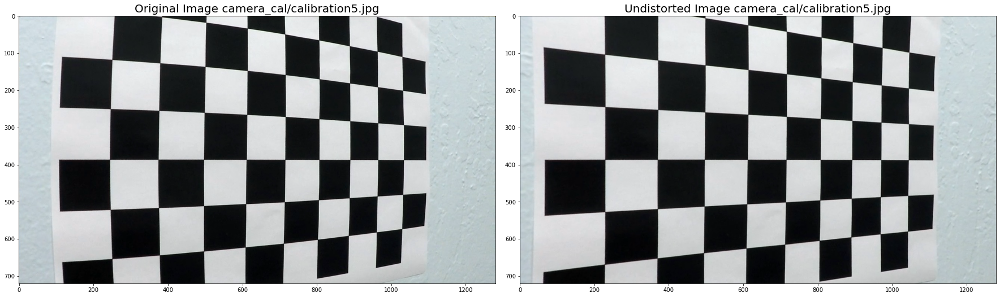

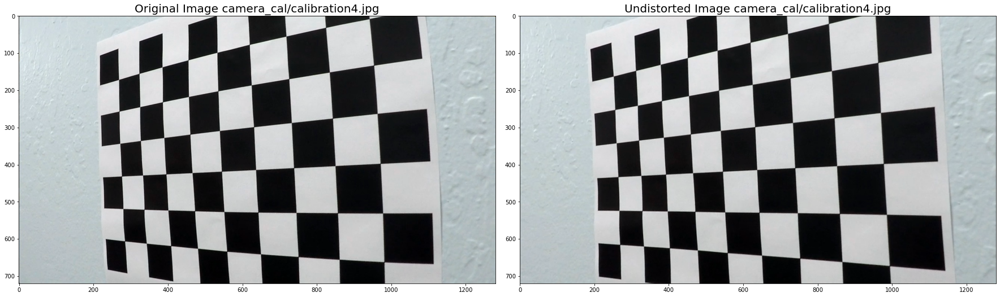

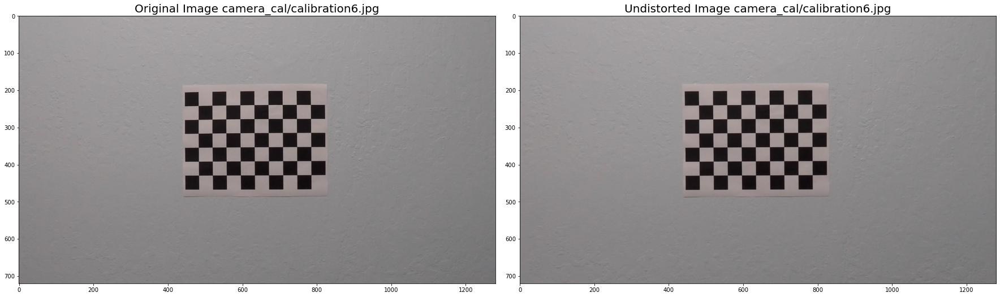

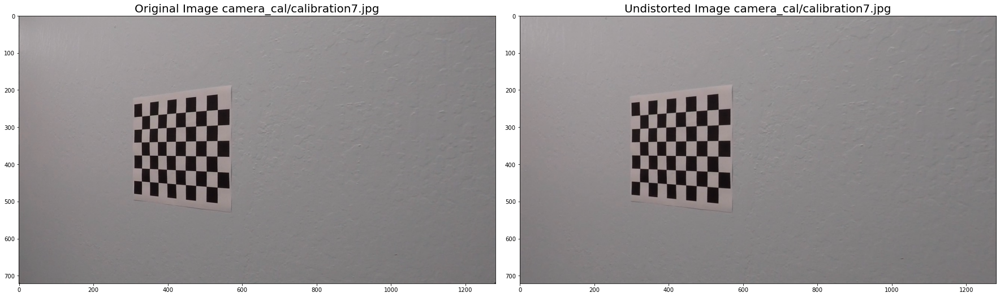

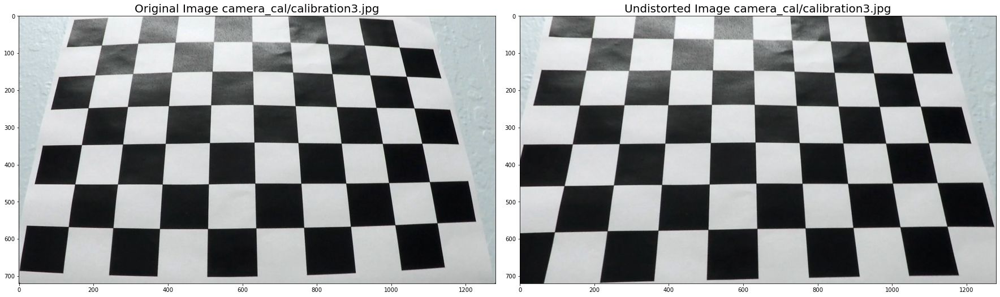

...

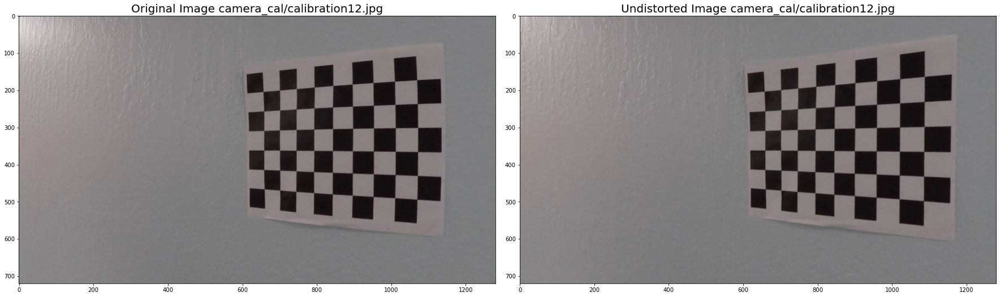

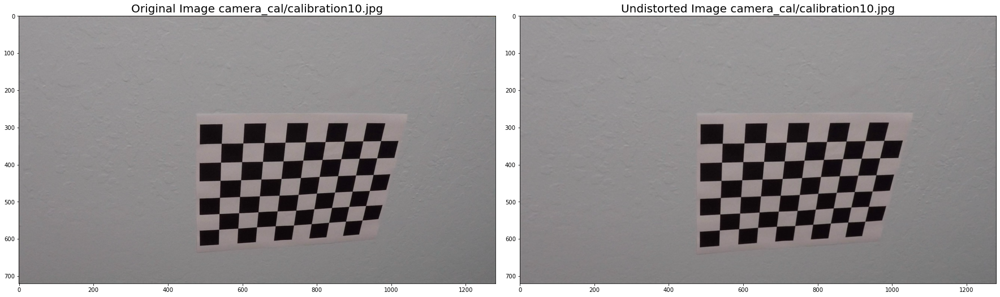

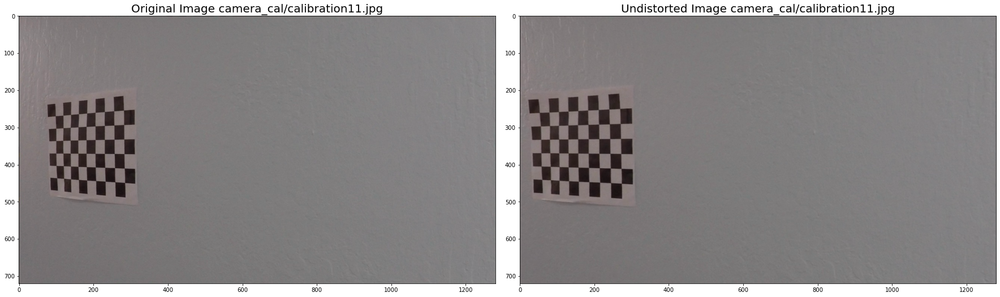

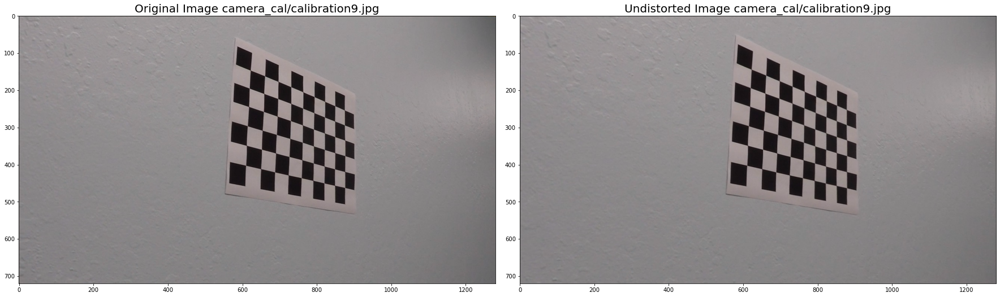

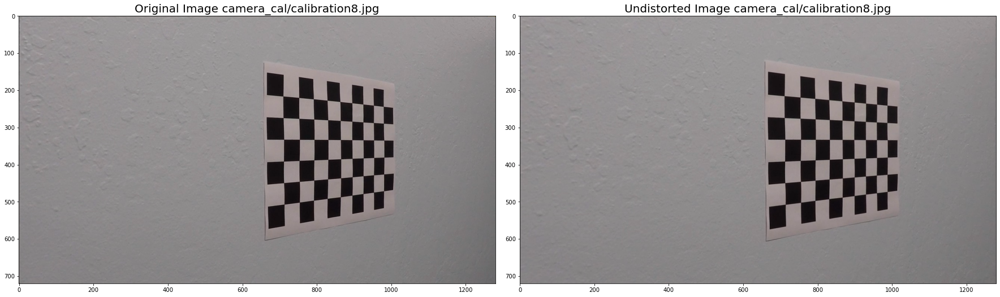

In [15]:
# Import packages
import numpy as np
import cv2
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline


# Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,9,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        """
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)
        """

# Calculate the distortion correction matrix
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)

#Save distortion correction data in a pickle file
data = [mtx, dist, rvecs, tvecs]
file = open('dist_correc_data.pckl', 'wb')
pickle.dump(data, file)
file.close()
del(file)


# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')


# Represent the undistorted images
for fname in images:
    img = cv2.imread(fname)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    #Save it
    #cv2.imwrite('output_images/Undist/calibration1.jpg', cv2.cvtColor(undist,cv2.COLOR_RGB2BGR))
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image '+ fname, fontsize=20)
    ax2.imshow(undist)
    ax2.set_title('Undistorted Image '+ fname, fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

___

## 2. Calculate perspective transform 

In this section, we will estimate the perspective transform matrix.

### Take source points from striaght lines images 

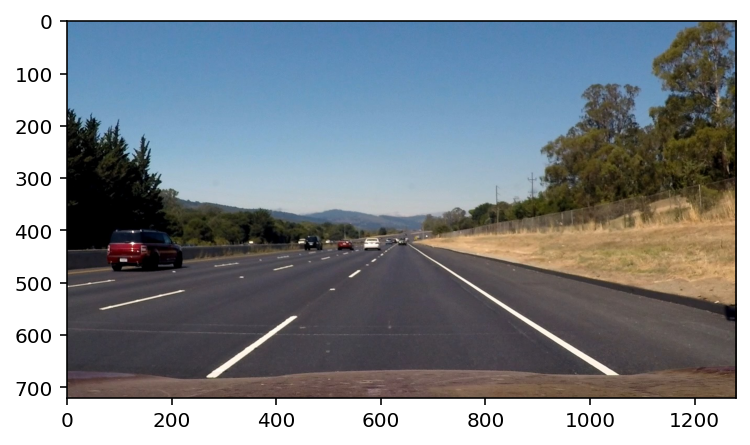

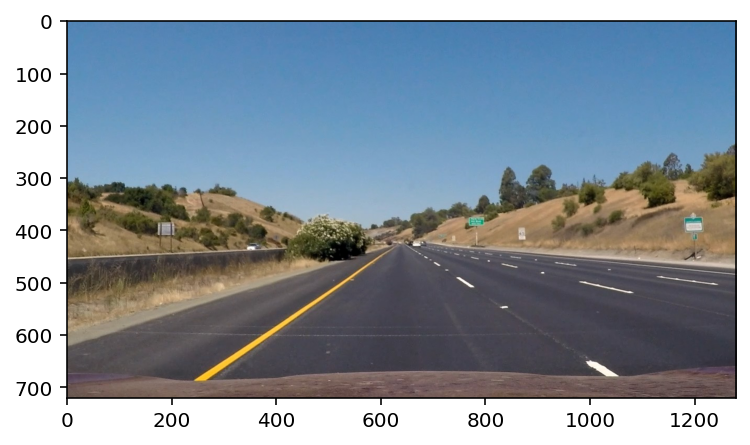

In [2]:
# Import packages
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle
%matplotlib qt

# Make a list of straight lines images
images = glob.glob('test_images/straight_lines*.jpg')

for image in images:
    img = mpimg.imread(image)
    plt.figure()
    plt.imshow(img)
    
    #Save it
    #cv2.imwrite("output_images/Perspective/straight_lines{}.jpg".format(fname[-5]), cv2.cvtColor(img,cv2.COLOR_RGB2BGR))
    

### Define perspective transform function

In [8]:
# Define perspective transform function
def persp_transform(src, dst):
    #Compute perspective transform, M
    M = cv2.getPerspectiveTransform(src, dst)
    #Compute the inverse perspective transform by swaping the input parameters, Minv
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M, Minv

def warped_img(img, M):
    img_size = (img.shape[1], img.shape[0])
    #Create warped image - uses linear interpolation
    warped = cv2.warpPerspective(img, M, img_size, flags = cv2.INTER_LINEAR)
    return warped

### Calculate perspective transforms from 2 images with straight lines

In [13]:
# Import packages
import numpy as np
import cv2
# Data taken from the photos
#WHITE LINES PHOTO
# Source coordinates
src_white = np.float32(
    [[592,450],
     [692,450],
     [1053,674],
     [270,674]])
# Destination coordinates
dst_white = np.float32(
    [[270,0],
     [1053,0],
     [1053,674],
     [270,674]])

#YELLOW LINES PHOTO
# Source coordinates
src_yellow = np.float32(
    [[591,450],
     [688,450],
     [1050,674],
     [257,674]])
# Destination coordinates
dst_yellow = np.float32([
    [257,0],
    [1050,0],
    [1050,674],
    [257,674]])

M_white, M_white_inv = persp_transform(src_white,dst_white)
M_yellow, M_yellow_inv = persp_transform(src_yellow,dst_yellow)

# Store perspective transforms
data = [M_white, M_white_inv, M_yellow, M_yellow_inv]
file = open('persp_transf_data.pckl', 'wb')
pickle.dump(data, file)
file.close()
del(file)

### Represent warped images

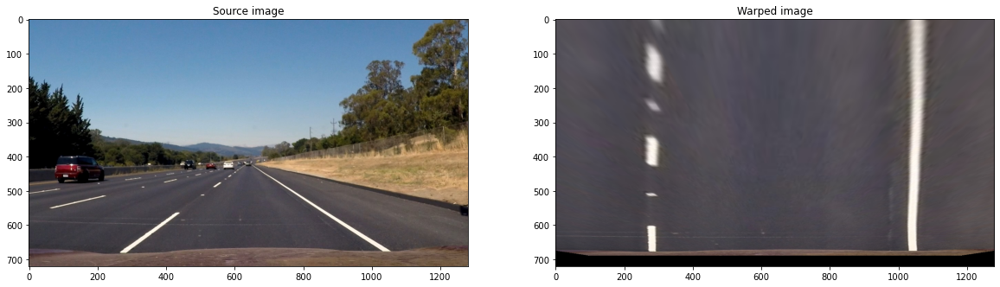

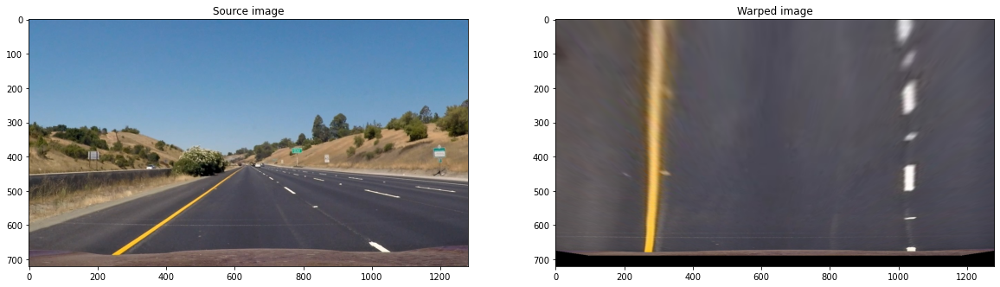

In [14]:
%matplotlib inline

# Make a list of straight lines images
images = glob.glob('test_images/straight_lines*.jpg')

for image in images:
    img = mpimg.imread(image)
    img_size = (img.shape[1], img.shape[0])
    
    warped = warped_img(img, M_yellow)

    f, (ax1,ax2) = plt. subplots(1,2, figsize=(20,10))
    ax1.set_title('Source image')
    ax1.imshow(img)
    ax2.set_title('Warped image')
    ax2.imshow(warped)
    
    #Save it
    #cv2.imwrite("output_images/Perspective/straight_lines_warped.jpg", cv2.cvtColor(warped,cv2.COLOR_RGB2BGR))
    

___

## 3. Image lane finding 

The steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

### Some function definitions to reduce pipeline code (images)

In [6]:
# Import packages
import numpy as np
import math
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle

#Function to create a binary image with color and gradient thresholds
def color_grad_threshold(img, s_thresh = (110, 255), sx_thresh=(20, 100)):
    """
    Makes a color and gradient thresholding of an image.
    """
    img=np.copy(img)
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    result = np.zeros_like(s_channel)
    result[(s_binary == 1) | (sxbinary == 1) ] = 1
    
    return result


def warped_img(img, M):
    """
    Makes a perspective transform of an image given the transformation
    matrix M.
    """
    
    img_size = (img.shape[1], img.shape[0])
    #Create warped image - uses linear interpolation
    warped = cv2.warpPerspective(img, M, img_size, flags = cv2.INTER_LINEAR)
    return warped

def find_lane_pixels(binary_warped, nwindows, margin, minpix):
    """
    Finds lane points with sliding-windows method.
    
    `binary_warped` is a thresholded image with lane lines 
    in eye-bird perspective.
    
    `nwindows` are the number of segmtens that divide the image
    to follow the curvature.
    
    `margin` is the width of each window. More width could imply
    taking more noisy points.
    
    `minpix` are the minimum number of pixels to slide a window.
    """
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        
        #Find the four below boundaries of the window #
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin # Update this
        win_xright_high = rightx_current + margin  # Update this


       # Draw the windows on the visualization image
       # cv2.rectangle(out_img,(win_xleft_low,win_y_low),
       # (win_xleft_high,win_y_high),(0,255,0), 2) 
       # cv2.rectangle(out_img,(win_xright_low,win_y_low),
       # (win_xright_high,win_y_high),(0,255,0), 2) 

        # TO-DO: Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window
        # (`right` or `leftx_current`) on their mean position
        if len(good_left_inds > minpix):
            leftx_current = np.int16(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds > minpix):
            rightx_current = np.uint16(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_poly_and_color_lane(binary_warped, nwindows = 9, margin = 100, minpix = 50):
    """
    Fits a 2D polynomial onto the lane lines with a set 
    of x and y coordinates of lane lines points.
    
    `binary_warped` is a thresholded image with lane lines 
    in eye-bird perspective.
    
    `nwindows` are the number of segmtens that divide the image
    to follow the curvature.
    
    `margin` is the width of each window. More width could imply
    taking more noisy points.
    
    `minpix` are the minimum number of pixels to slide a window.
    """
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped, nwindows, margin, minpix)

    #Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
    ## Visualization ##
    # Color the lane boundaries
    left_line = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_line = np.array([np.flipud(np.transpose(np.vstack([right_fitx, 
                              ploty])))])
    lane_bound = np.hstack((left_line, right_line))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(out_img, np.int_([lane_bound]), (0,255, 0))
    
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return out_img, left_fit, right_fit, left_fitx, right_fitx, ploty

def measure_curvature_real(left_fit, right_fit, ploty):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)*ym_per_pix
    
    # Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = (1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**(3/2)/np.abs(2*left_fit[0])
    right_curverad = (1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**(3/2)/np.abs(2*right_fit[0])
    
    return left_curverad, right_curverad

def measure_center_offs_real(leftx, rightx, center):
    '''
    Calculates the offset with respect the lane center.
    '''
    # Define conversion in x from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    
    # Assuming the camera is mounted at the center of the car, the offset from it is:
    center_offs = ((leftx + rightx) / 2 - center)*xm_per_pix
    
    return center_offs

def weighted_img(img, initial_img, α, β, γ):
    """
    `img` is an image with things drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

def display_result_img(img, initial_img, rad_cr, center_offs, α=1, β=.4, γ=0.):
    """
    `img` is an image with things drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image has some text info and is a weighted
    result of the two input images.
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    
    font                   = cv2.FONT_HERSHEY_SIMPLEX
    bottomLeftCornerOfText = (10,50)
    fontScale              = 2
    fontColor              = (0,200,0)
    thickness              = 5
    lineType               = 2
    
    text_img = np.copy(initial_img)
    
    #Add the information of radius and offset
    radius_info = 'Radius of Curvature = {}m'.format(np.round(rad_cr))
    
    if center_offs > 0:
        offs_info = 'Vehicle is {}m right of the center'.format(np.round(center_offs, 2))
    elif center_offs < 0:
        offs_info = 'Vehicle is {}m left of the center'.format(np.round(-center_offs, 2))
    else:
        offs_info = 'Vehicle is centered'
        
    cv2.putText(text_img,radius_info, (10, 50), font, fontScale,fontColor, thickness, lineType)
    cv2.putText(text_img,offs_info, (10, 150), font, fontScale,fontColor, thickness,lineType)
    
    output = weighted_img(img, text_img, α=1, β=.4, γ=0.)
    
    return output
    
    ## Visualization ##
    # Color the lane boundaries
    left_line = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_line = np.array([np.flipud(np.transpose(np.vstack([right_fitx, 
                              ploty])))])
    lane_bound = np.hstack((left_line, right_line))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(out_img, np.int_([lane_bound]), (0,255, 0))
    

### Pipeline for image lane finding

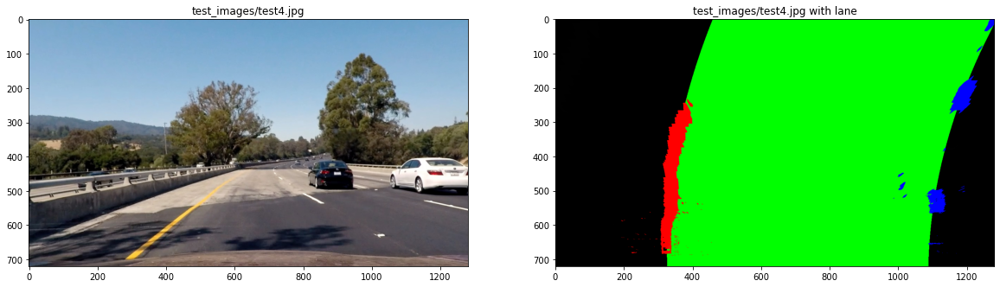

In [17]:
### DATA 
# Taking pre-calculated distortion correction data
file = open('dist_correc_data.pckl', 'rb')
mtx, dist, rvecs, tvecs  = pickle.load(file)
file.close()
del(file)

#Taking perspective transform data
file = open('persp_transf_data.pckl', 'rb')
M_white, M_white_inv, M_yellow, M_yellow_inv  = pickle.load(file)
file.close()
del(file)


# Make a list of testing images
images = glob.glob('test_images/test4.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = mpimg.imread(fname)
    
    #1. Apply a distortion correction to raw images.
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    #2. Use color transforms, gradients, etc., to create a thresholded binary image.
    binary = color_grad_threshold(undist, s_thresh = (150, 255), sx_thresh=(20, 100))
    
    #3. Apply a perspective transform to rectify binary image ("birds-eye view").
    warped = warped_img(binary, M_yellow) 
    
    #4. Detect lane pixels and fit to find the lane boundary
    wind_fit_img, left_fit, right_fit, left_fitx, right_fitx, ploty = fit_poly_and_color_lane(warped, margin = 130,minpix = 50)
    
    #5. Determine the curvature of the lane and vehicle position with respect to center.
    left_curverad, right_curverad = measure_curvature_real(left_fit, right_fit, ploty)
    radius = (left_curverad + right_curverad)/2
    center_offs = measure_center_offs_real(left_fitx[-1], right_fitx[-1], img.shape[1]/2)
    
    
    #6. Warp the detected lane boundaries back onto the original image.
    unwarped_lanes = warped_img(wind_fit_img, M_yellow_inv)
    
    #7. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
    lane_display_img = display_result_img(unwarped_lanes,img, radius, center_offs)
    
    # Save the images
    #cv2.imwrite("test_images_output/" + img_str, cv2.cvtColor(lane_lines_image,cv2.COLOR_RGB2BGR))

    f, (ax1,ax2) = plt. subplots(1,2, figsize=(20,10))
    ax1.set_title(fname)
    ax1.imshow(undist)
    ax2.set_title(fname + ' with lane')
    plt.xlim(0, 1280)
    plt.ylim(0, 720)
    plt.gca().invert_yaxis() # to visualize as we do the images
    ax2.imshow(wind_fit_img)

    #Save it
    cv2.imwrite("output_images/polyfit/test4.jpg", cv2.cvtColor(wind_fit_img,cv2.COLOR_RGB2BGR))


    

___

### 4. Video lane finding

After applying the previous pipeline we will add:

* The functionality to count lane lines pixels looking for them only around the previous polynomial fit. This makes the searching lighter.

* A new class Line() for store and refresh some lane lines data. They can be used for averaging or sanity checking purposes.

### Some function definitions to reduce pipeline code (videos)

In [8]:
# Import packages
import numpy as np
import math
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle
from collections import deque

#Function to create a binary image with color and gradient thresholds
def color_grad_threshold(img, s_thresh = (110, 255), sx_thresh=(20, 100)):
    """
    Makes a color and gradient thresholding of an image.
    """
    img=np.copy(img)
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    result = np.zeros_like(s_channel)
    result[(s_binary == 1) | (sxbinary == 1) ] = 1
    
    return result


def warped_img(img, M):
    """
    Makes a perspective transform of an image given the transformation
    matrix M.
    """
    img_size = (img.shape[1], img.shape[0])
    #Create warped image - uses linear interpolation
    warped = cv2.warpPerspective(img, M, img_size, flags = cv2.INTER_LINEAR)
    return warped

def search_around_poly(binary_warped, left_fit, right_fit, margin):
    """
    Finds lane lines points searching in a bounded region around a
    polynomial function.
    
    `binary_warped` is a thresholded image with lane lines 
    in eye-bird perspective.
    
    `left_fit` are the coefficients of the left line fitting 
    polynomial.
    
    `right_fit` are the coefficients of the left line fitting 
    polynomial.
    
    `margin` is a parameter to configure the size of the bounded 
    region where points are taken.
    """

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    
    # Set the area of search based on activated x-values ###
    # within the +/- margin of our polynomial function ###
    leftx_current = np.polyval(left_fit,np.arange(binary_warped.shape[0]))
    rightx_current = np.polyval(right_fit,np.arange(binary_warped.shape[0]))
    
    line_xleft_low = leftx_current - margin  # Update this
    line_xleft_high = leftx_current + margin  # Update this
    line_xright_low = rightx_current - margin # Update this
    line_xright_high = rightx_current + margin  # Update this
    
    # Hint: consider the window areas for the similarly named variables ###
    # in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox >= np.polyval(left_fit-[0,0,margin],nonzeroy)) & 
                        (nonzerox < np.polyval(left_fit+[0,0,margin],nonzeroy)))
    
    right_lane_inds = ((nonzerox >= np.polyval(right_fit-[0,0,margin],nonzeroy)) &  
                     (nonzerox < np.polyval(right_fit+[0,0,margin],nonzeroy)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    return leftx, lefty, rightx, righty, out_img

def find_lane_pixels(binary_warped, nwindows, margin, minpix):
    """
    Finds lane points with sliding-windows method.
    
    `binary_warped` is a thresholded image with lane lines 
    in eye-bird perspective.
    
    `nwindows` are the number of segmtens that divide the image
    to follow the curvature.
    
    `margin` is the width of each window. More width could imply
    taking more noisy points.
    
    `minpix` are the minimum number of pixels to slide a window.
    """
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        
        #Find the four below boundaries of the window #
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin # Update this
        win_xright_high = rightx_current + margin  # Update this

        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window
        # (`right` or `leftx_current`) on their mean position
        if len(good_left_inds > minpix):
            leftx_current = np.int16(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds > minpix):
            rightx_current = np.uint16(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_poly_and_color_lane_lines(binary_warped, sanity_pass, left_fit, right_fit, nwindows = 9, margin = 100, minpix = 50):
    """
    Fits a 2D polynomial onto the lane lines with a set 
    of x and y coordinates of lane lines points.
    
    `binary_warped` is a thresholded image with lane lines 
    in eye-bird perspective.
    
    `nwindows` are the number of segmtens that divide the image
    to follow the curvature.
    
    `margin` is the width of each window. More width could imply
    taking more noisy points.
    
    `minpix` are the minimum number of pixels to slide a window.
    """
    
    # Find our lane pixels first
    if (sanity_pass):
        leftx, lefty, rightx, righty, out_img = search_around_poly(binary_warped, left_fit, right_fit, margin)
    else:
        leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped, nwindows, margin, minpix)

    #Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    left_fitx, right_fitx, ploty = generate_plot_values(binary_warped, left_fit, right_fit)
    
    return out_img, left_fit, right_fit, left_fitx, right_fitx

def generate_plot_values(img, left_fit, right_fit):
    '''
    Generates x and y plot values given a 2D polynomial
    coefficients for each lane line.
    '''
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    return left_fitx, right_fitx, ploty

def measure_curvature_real(img, left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)*ym_per_pix
    
    # Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = (1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**(3/2)/np.abs(2*left_fit[0])
    right_curverad = (1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**(3/2)/np.abs(2*right_fit[0])
    
    return left_curverad, right_curverad

def measure_center_offs_real(leftx, rightx, center):
    '''
    Calculates the offset with respect the lane center.
    '''
    # Define conversion in x from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    
    # Assuming the camera is mounted at the center of the car, the offset from it is:
    center_offs = ((leftx + rightx) / 2 - center)*xm_per_pix
    
    return center_offs


def sanity_checks(left_curverad, right_curverad, left_fitx, right_fitx, max_curv_inc = 300, right_lane_width = (3,4.5), max_parallel_deviation = 0.5):
    
    """
    `left_curverad` is the curve radius of a left lane line
    in metters
    
    `right_curverad` is the curve radius of a right lane line
    in metters
    
    `left fitx` is a list with the x coordinates of a left lane
    line in an image in pixels.
    
    `right fitx` is a list with the x coordinates of a right lane
    line in an image in pixels.
    
    """
    
    # Define conversions in x and y from pixels space to meters
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    similar_curvature = False
    right_width = False
    parallel = False
    sanity_pass = False
    
    # Checking that they have similar curvature
    if (left_curverad - right_curverad) < max_curv_inc:
        similar_curvature = True
        
    
    # Checking that they are separated by approximately the right distance horizontally
    lane_width_px = np.average(right_fitx - left_fitx)
    lane_width_m = lane_width_px * xm_per_pix
    
    if (lane_width_m >= right_lane_width[0]) and (lane_width_m <= right_lane_width[1]):
        right_width = True
        
    # Checking that they are roughly parallel
    right_fitx_moved = right_fitx - lane_width_px #Move the right line to the left
    max_lines_diff = np.max(np.abs(left_fitx - right_fitx_moved)) * xm_per_pix
    
    if (max_lines_diff <= max_parallel_deviation):
        parallel = True
        
    sanity_pass = similar_curvature & right_width & parallel
    
    return sanity_pass
    
# Define a class to receive the characteristics of each line detection
class Line():
    """
    Class to store and refresh the characteristics of each line detection
    """
    def __init__(self, n_it = 4):
        # Number of n fits for the averaging
        self.n = n_it
        # was the line detected in the last iteration?
        self.detected = False
        #polynomial coefficients for the most recent fit
        self.current_fit = np.array([0,0,0], dtype='float')
        # polynomial coefficients of the last n fits of the line
        self.recent_fitted = [] 
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None   
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #current_radius
        self.recent_radius = []
        self.best_radius = None
        
    def refresh_values(self, sanity_pass, poly_fit, radius ):
        if sanity_pass:
            self.detected = True
            self.current_fit = np.array(poly_fit, dtype = 'float')
            self.recent_fitted.append(self.current_fit)
            self.recent_radius.append(radius)
            
            if len(self.recent_fitted) == self.n:
                self.recent_fitted.pop(0)
                self.recent_radius.pop(0)
                
            self.best_fit = np.mean(self.recent_fitted, axis = 0)
            self.best_radius = np.mean(self.recent_radius)
        else:
            self.detected = False
            if len(self.recent_fitted) == self.n:
                self.recent_fitted.pop(0)
                self.recent_radius.pop(0)
                

def fill_lane(img, left_fit, right_fit):
    """ 
    Fill lane boundaries given 2D polynomial
    coefficients for each lane line.
    """
    
    # Generate x and y values for plotting
    left_fitx, right_fitx, ploty = generate_plot_values(img, left_fit, right_fit)

    
    ## Visualization ##
    # Color the lane boundaries
    left_line = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_line = np.array([np.flipud(np.transpose(np.vstack([right_fitx, 
                              ploty])))])
    lane_bound = np.hstack((left_line, right_line))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(img, np.int_([lane_bound]), (0,255, 0))
    
    return img
                
                
                
def weighted_img(img, initial_img, α, β, γ):
    """
    `img` is an image with things drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

def display_result_img(img, initial_img, rad_cr, center_offs, α=1, β=.4, γ=0.):
    """
    `img` is an image with things drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image has some text info and is a weighted
    result of the two input images.
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    
    
    font                   = cv2.FONT_HERSHEY_SIMPLEX
    bottomLeftCornerOfText = (10,50)
    fontScale              = 2
    fontColor              = (255,255,255)
    thickness              = 5
    lineType               = 2
    
    text_img = np.copy(initial_img)
    
    #Add the information of radius and offset
    radius_info = 'Radius of Curvature = {}m'.format(np.uint32(np.round(rad_cr)))
    
    if center_offs > 0:
        offs_info = 'Vehicle is {}m right of the center'.format(np.round(center_offs, 2))
    elif center_offs < 0:
        offs_info = 'Vehicle is {}m left of the center'.format(np.round(-center_offs, 2))
    else:
        offs_info = 'Vehicle is centered'
        
    cv2.putText(text_img,radius_info, (10, 50), font, fontScale,fontColor, thickness, lineType)
    cv2.putText(text_img,offs_info, (10, 150), font, fontScale,fontColor, thickness,lineType)
    
    output = weighted_img(img, text_img, α=.7, β=.3, γ=0.)
    
    return output
        

In [9]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from collections import deque

In [10]:
### DATA 
# Taking pre-calculated distortion correction data
file = open('dist_correc_data.pckl', 'rb')
mtx, dist, rvecs, tvecs  = pickle.load(file)
file.close()
del(file)

#Taking perspective transform data
file = open('persp_transf_data.pckl', 'rb')
M_white, M_white_inv, M_yellow, M_yellow_inv  = pickle.load(file)
file.close()
del(file)

def process_image(img):

    #1. Apply a distortion correction to raw images.
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    #2. Use color transforms, gradients, etc., to create a thresholded binary image.
    binary = color_grad_threshold(undist, s_thresh = (150, 255), sx_thresh=(30, 100))
    
    #3. Apply a perspective transform to rectify binary image ("birds-eye view").
    warped = warped_img(binary, M_yellow) 
    
    #4. Detect lane pixels and fit to find the lane lines
    lane_lines_img, left_fit, right_fit, left_fitx, right_fitx = fit_poly_and_color_lane_lines(warped, (Left_Line.detected & Right_Line.detected), Left_Line.best_fit, Right_Line.best_fit,  margin = 130,minpix = 50)
    
    #5. Determine the curvature of the lane and vehicle position with respect to center.
    left_curverad, right_curverad = measure_curvature_real(lane_lines_img, left_fit, right_fit)
    #radius = (left_curverad + right_curverad)/2
    center_offs = measure_center_offs_real(left_fitx[-1], right_fitx[-1], lane_lines_img.shape[1]/2)
    
    #6. Evaluate Sanity of the obtained fits.
    sanity_pass = sanity_checks(left_curverad, right_curverad, left_fitx, right_fitx)
    
    #7. Refresh line class values.
    Left_Line.refresh_values(sanity_pass, left_fit, left_curverad)
    Right_Line.refresh_values(sanity_pass, right_fit, right_curverad)
    
    #8. Fill lane bounds
    lane_img = fill_lane(lane_lines_img, left_fit, right_fit) 
    
    
    #9. Warp the detected lane boundaries back onto the original image.
    unwarped_lanes = warped_img(lane_img, M_yellow_inv)
    
    #10. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
    radius = (Left_Line.best_radius + Right_Line.best_radius)/2
    lane_display_img = display_result_img(unwarped_lanes,img, radius, center_offs)
    
    return lane_display_img





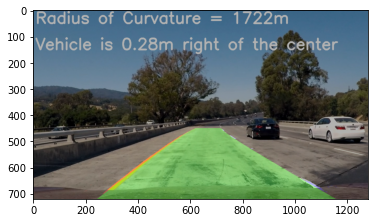

In [11]:
# Instatiate and initialize line classes
Left_Line = Line()
Right_Line = Line()

im_in = mpimg.imread('test_images/test1.jpg')

img_out = process_image(im_in)

plt.imshow(img_out )

Let's try the one with the solid white lane on the right first ...

In [12]:
# Instatiate and initialize line classes
Left_Line = Line(10)
Right_Line = Line(10)


white_output = 'project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
clip1 = VideoFileClip("project_video.mp4")
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False, fps = 20)

Moviepy - Building video project_video_1.mp4.
Moviepy - Writing video project_video_1.mp4



Moviepy - Done !
Moviepy - video ready project_video_1.mp4
CPU times: user 1min 32s, sys: 21.7 s, total: 1min 53s
Wall time: 1min 14s


In [13]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))